<a href="https://colab.research.google.com/github/nataliachmurak/colourisation/blob/main/Landscape_noGAN_CIELAB.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [37]:
from keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
from zipfile import ZipFile
from sklearn.model_selection import train_test_split
import os
from matplotlib import pyplot
from tensorflow import keras
from tensorflow.keras.preprocessing import image_dataset_from_directory
import numpy as np
import tensorflow as tf


#importing cifar 
from matplotlib import pyplot
from keras.datasets import cifar10
from keras import backend as K


#importing keras
from keras.layers import Conv2D, UpSampling2D, InputLayer, Conv2DTranspose
from keras.layers import Activation, Dense, Dropout, Flatten
from keras.layers.normalization import BatchNormalization
from keras.models import Sequential
from keras.utils import to_categorical
from keras.metrics import AUC
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
from keras.callbacks import Callback

#parameters searches
from sklearn.model_selection import GridSearchCV
from keras.wrappers.scikit_learn import KerasClassifier

from keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
from keras.models import save_model, load_model

#colour schemes
from skimage.color import rgb2lab, lab2rgb, rgb2gray, xyz2lab
from skimage.color import rgb2gray
from skimage.io import imsave, imread
from skimage import io
from skimage.transform import resize

from skimage.color import rgb2lab, lab2rgb, rgb2gray, xyz2lab
import numpy as np 

#others
import numpy as np
import os
import random
import tensorflow as tf
import cv2
import math

In [ ]:
!curl -O http://images.cocodataset.org/zips/unlabeled2017.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 18.7G  100 18.7G    0     0  44.2M      0  0:07:13  0:07:13 --:--:-- 46.2M


In [ ]:
!unzip unlabeled2017.zip

In [52]:
from PIL import Image
from sklearn.model_selection import train_test_split
import tensorflow as tf
import numpy as np
import os
#colour schemes
from skimage.color import rgb2lab, lab2rgb, rgb2gray, xyz2lab
from skimage.color import rgb2gray
from skimage.io import imsave, imread
from skimage import io
from skimage.transform import resize

# The batch size we'll use for training
batch_size = 64
# The batch size we'll use for training

# Size of the image required to train our model
img_size = 128

# These many images will be used from the data archive
dataset_split = 4000

#master_dir = "drive/MyDrive/NCD"
master_dir = "drive/MyDrive/places"
#master_dir = "unlabeled2017"

path = "drive/MyDrive/places/Gym2_png.jpg"

os.remove(path)

x = []
y = []
for image_file in os.listdir( master_dir )[ 0 : dataset_split ]:
    rgb_image = Image.open( os.path.join( master_dir , image_file ) ).resize( ( img_size , img_size ) )
    #rgb_img_array = (np.asarray( rgb_image ) ) / 255
    #gray_image = rgb_image.convert( 'L' )
    #gray_img_array = ( np.asarray( gray_image ).reshape( ( img_size , img_size , 1 ) ) ) / 255
    #x.append( gray_img_array )
    #y.append( rgb_img_array )
    print(image_file)
    rgb_img_array = (np.asarray( rgb_image ) ) 
    image = rgb_img_array
    print(image.shape)
    Y = rgb2lab(1.0/255 * image)[:,:,1:]
    Y = Y / 128
    X = rgb2lab(1.0/255 * image)[:,:,0]
    X = np.expand_dims(X, 2)
    x.append(X)
    y.append(Y)

    

#print(X.shape)
#print(Y.shape)   
#print(image.shape)

# Train-test splitting
train_x, test_x, train_y, test_y = train_test_split( np.array(x), np.array(y), test_size=0.1 )
print(train_x.shape)
print(train_y.shape)
print(test_y.shape)

# Construct tf.data.Dataset object
dataset = tf.data.Dataset.from_tensor_slices( ( train_x , train_y ) )
dataset = dataset.batch( batch_size )

Streaming output truncated to the last 5000 lines.
(128, 128, 3)
center_point.jpg
(128, 128, 3)
centralplaza.jpg
(128, 128, 3)
chp_shoppingmall.jpg
(128, 128, 3)
cover_home3.jpg
(128, 128, 3)
consumer1.jpg
(128, 128, 3)
crocker_galleria_735089.jpg
(128, 128, 3)
deira_city_centre_dubai_08.jpg
(128, 128, 3)
d8 (2).jpg
(128, 128, 3)
eastridg1.jpg
(128, 128, 3)
dungarv_new_mall.jpg
(128, 128, 3)
full_shopping_Central_1.jpg
(128, 128, 3)
easyfranchise_centre_commercial_1.jpg
(128, 128, 3)
eaton_centre_2001_03.jpg
(128, 128, 3)
galleria1.jpg
(128, 128, 3)
galleria.jpg
(128, 128, 3)
galleria2.jpg
(128, 128, 3)
galleria_vittorio_emanuele_ii_milan_mlgalar.jpg
(128, 128, 3)
galleria_san_federico_nr_109_2_n1.jpg
(128, 128, 3)
hillsdale_mall_photo1.jpg
(128, 128, 3)
hillsdale_mall_4.jpg
(128, 128, 3)
img_7908_kyoto_eki_center_109.jpg
(128, 128, 3)
hillsdale_mall_photo2.jpg
(128, 128, 3)
hillsdale_shopping_center.jpg
(128, 128, 3)
img_7920_kyoto_eki_escalators_112.jpg
(128, 128, 3)
ins23.jpg
(128, 

In [34]:
def get_model():
  layers = [
    tf.keras.layers.Input( shape=( 128 , 128 , 1 ) ),

    tf.keras.layers.Conv2D( 32 , kernel_size=( 3 , 3 ) , strides=1),
    tf.keras.layers.Conv2D( 32 , kernel_size=( 3 , 3 ) , strides=1),
    tf.keras.layers.LeakyReLU(),

    tf.keras.layers.Conv2D( 64 , kernel_size=( 5 , 5 ) , strides=1 ),
    tf.keras.layers.Conv2D( 64 , kernel_size=( 5 , 5 ) , strides=1 ),
    tf.keras.layers.LeakyReLU(),

    tf.keras.layers.Conv2D( 128 , kernel_size=( 3 , 3 ) , strides=1 ),
    tf.keras.layers.Conv2D( 128 , kernel_size=( 3 , 3 ) , strides=1 ),
    tf.keras.layers.LeakyReLU(),

    tf.keras.layers.Conv2D( 256 , kernel_size=( 3 , 3 ) , strides=1 ),
    tf.keras.layers.Conv2D( 256 , kernel_size=( 3 , 3 ), strides=1 ),
    tf.keras.layers.LeakyReLU(),
    

    tf.keras.layers.Conv2DTranspose( 256 , kernel_size=( 3 , 3 ) , strides=1 , activation='relu' ),
    #tf.keras.layers.Conv2DTranspose( 256 , kernel_size=( 3 , 3 ) , strides=1 , activation='relu' ),
    tf.keras.layers.Conv2DTranspose( 128 , kernel_size=( 3 , 3 ) , strides=1 , activation='relu' ),
    #tf.keras.layers.Conv2DTranspose( 128 , kernel_size=( 3 , 3 ) , strides=1 , activation='relu' ),
    tf.keras.layers.Conv2DTranspose( 64 , kernel_size=( 3 , 3 ) , strides=1 , activation='relu' ),

    
    #tf.keras.layers.Conv2DTranspose( 64 , kernel_size=( 3 , 3 ) , strides=1 , activation='relu' ),
    #tf.keras.layers.Conv2DTranspose( 64 , kernel_size=( 3 , 3 ) , strides=1 , activation='relu' ),
    tf.keras.layers.Conv2DTranspose( 32 , kernel_size=( 3 , 3 ) , strides=1 , activation='relu' ),
    tf.keras.layers.Conv2DTranspose( 16 , kernel_size=( 5 , 5 ) , strides=1 , activation='relu' ),
    tf.keras.layers.Conv2DTranspose( 8 , kernel_size=( 5 , 5 ) , strides=1 , activation='relu' ),

    
    #tf.keras.layers.Conv2DTranspose( 32 , kernel_size=( 3 , 3 ) , strides=1 , activation='relu'),
    #tf.keras.layers.Conv2DTranspose( 32 , kernel_size=( 3 , 3 ) , strides=1 , activation='relu'),
    tf.keras.layers.Conv2DTranspose( 3 , kernel_size=( 5 , 5 ) , strides=1 , activation='tanh') ]
  model = tf.keras.models.Sequential( layers ) 
    
  print(model.summary())
  return model

model = get_model()  

Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_69 (Conv2D)           (None, 126, 126, 32)      320       
_________________________________________________________________
conv2d_70 (Conv2D)           (None, 124, 124, 32)      9248      
_________________________________________________________________
leaky_re_lu_16 (LeakyReLU)   (None, 124, 124, 32)      0         
_________________________________________________________________
conv2d_71 (Conv2D)           (None, 120, 120, 64)      51264     
_________________________________________________________________
conv2d_72 (Conv2D)           (None, 116, 116, 64)      102464    
_________________________________________________________________
leaky_re_lu_17 (LeakyReLU)   (None, 116, 116, 64)      0         
_________________________________________________________________
conv2d_73 (Conv2D)           (None, 114, 114, 128)    

In [53]:
def create_model():
  layers = [
      tf.keras.layers.InputLayer(input_shape=(128, 128, 1)),
      tf.keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same'),
      tf.keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same', strides=2),
      tf.keras.layers.BatchNormalization(),
      tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same'),
      tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same', strides=2),
      tf.keras.layers.BatchNormalization(),
      tf.keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same'),
      tf.keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same', strides=2),
      tf.keras.layers.BatchNormalization(),
      tf.keras.layers.Conv2D(256, (3, 3), activation='relu', padding='same'),
      tf.keras.layers.Conv2D(256, (3, 3), activation='relu', padding='same'),
      tf.keras.layers.BatchNormalization(),
      tf.keras.layers.Conv2D(512, (3, 3), activation='relu', padding='same'),
      tf.keras.layers.BatchNormalization(),
      tf.keras.layers.Conv2D(256, (3, 3), activation='relu', padding='same'),
      tf.keras.layers.BatchNormalization(),
      tf.keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same'),
      tf.keras.layers.BatchNormalization(),
      tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same'),
      tf.keras.layers.BatchNormalization(),
      tf.keras.layers.UpSampling2D((2, 2)),
      tf.keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same'),
      tf.keras.layers.BatchNormalization(),
      tf.keras.layers.UpSampling2D((2, 2)),
      tf.keras.layers.Conv2D(16, (3, 3), activation='relu', padding='same'),
      tf.keras.layers.BatchNormalization(),
      tf.keras.layers.UpSampling2D((2, 2)),
      tf.keras.layers.Conv2D(2, (3, 3), activation='tanh', padding='same') ]
    
  model = tf.keras.models.Sequential( layers ) 
  print(model.summary())
  return model

model = create_model()
print('Done!')

Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_77 (Conv2D)           (None, 128, 128, 32)      320       
_________________________________________________________________
conv2d_78 (Conv2D)           (None, 64, 64, 32)        9248      
_________________________________________________________________
batch_normalization_26 (Batc (None, 64, 64, 32)        128       
_________________________________________________________________
conv2d_79 (Conv2D)           (None, 64, 64, 64)        18496     
_________________________________________________________________
conv2d_80 (Conv2D)           (None, 32, 32, 64)        36928     
_________________________________________________________________
batch_normalization_27 (Batc (None, 32, 32, 64)        256       
_________________________________________________________________
conv2d_81 (Conv2D)           (None, 32, 32, 128)      

In [54]:
model.compile(optimizer='Adam', loss='mse', metrics=[tf.keras.metrics.MeanSquaredError(), 'accuracy'])
print('Done!')

Done!


In [62]:
model.fit(train_x, train_y, epochs=100, validation_data=(test_x, test_y))

Epoch 1/100
113/113 [==============================] - 5s 42ms/step - loss: 0.0105 - mean_squared_error: 0.0105 - accuracy: 0.6948 - val_loss: 0.0106 - val_mean_squared_error: 0.0106 - val_accuracy: 0.6821
Epoch 2/100
113/113 [==============================] - 5s 42ms/step - loss: 0.0103 - mean_squared_error: 0.0103 - accuracy: 0.6946 - val_loss: 0.0108 - val_mean_squared_error: 0.0108 - val_accuracy: 0.6709
Epoch 3/100
113/113 [==============================] - 5s 42ms/step - loss: 0.0099 - mean_squared_error: 0.0099 - accuracy: 0.6944 - val_loss: 0.0111 - val_mean_squared_error: 0.0111 - val_accuracy: 0.6690
Epoch 4/100
113/113 [==============================] - 5s 42ms/step - loss: 0.0097 - mean_squared_error: 0.0097 - accuracy: 0.6952 - val_loss: 0.0122 - val_mean_squared_error: 0.0122 - val_accuracy: 0.6158
Epoch 5/100
113/113 [==============================] - 5s 42ms/step - loss: 0.0092 - mean_squared_error: 0.0092 - accuracy: 0.6939 - val_loss: 0.0116 - val_mean_squared_error: 

In [63]:
model.evaluate(test_x, test_y, batch_size=64, verbose=1)

output = model.predict(test_x[:72])
output *= 128
print('Done!')
print(output.shape)

7/7 [==============================] - 0s 23ms/step - loss: 0.0115 - mean_squared_error: 0.0115 - accuracy: 0.6667
Done!
(72, 128, 128, 2)


In [ ]:
pyplot.figure(figsize=(30, 30))
for i in range(72):
  pyplot.subplot(8, 9, i+1)
  pyplot.imshow((output[i]*255).astype('uint8'))
pyplot.show() 

/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1068: UserWarning: Color data out of range: Z < 0 in 4 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))
/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1068: UserWarning: Color data out of range: Z < 0 in 1 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))
/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1068: UserWarning: Color data out of range: Z < 0 in 6 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


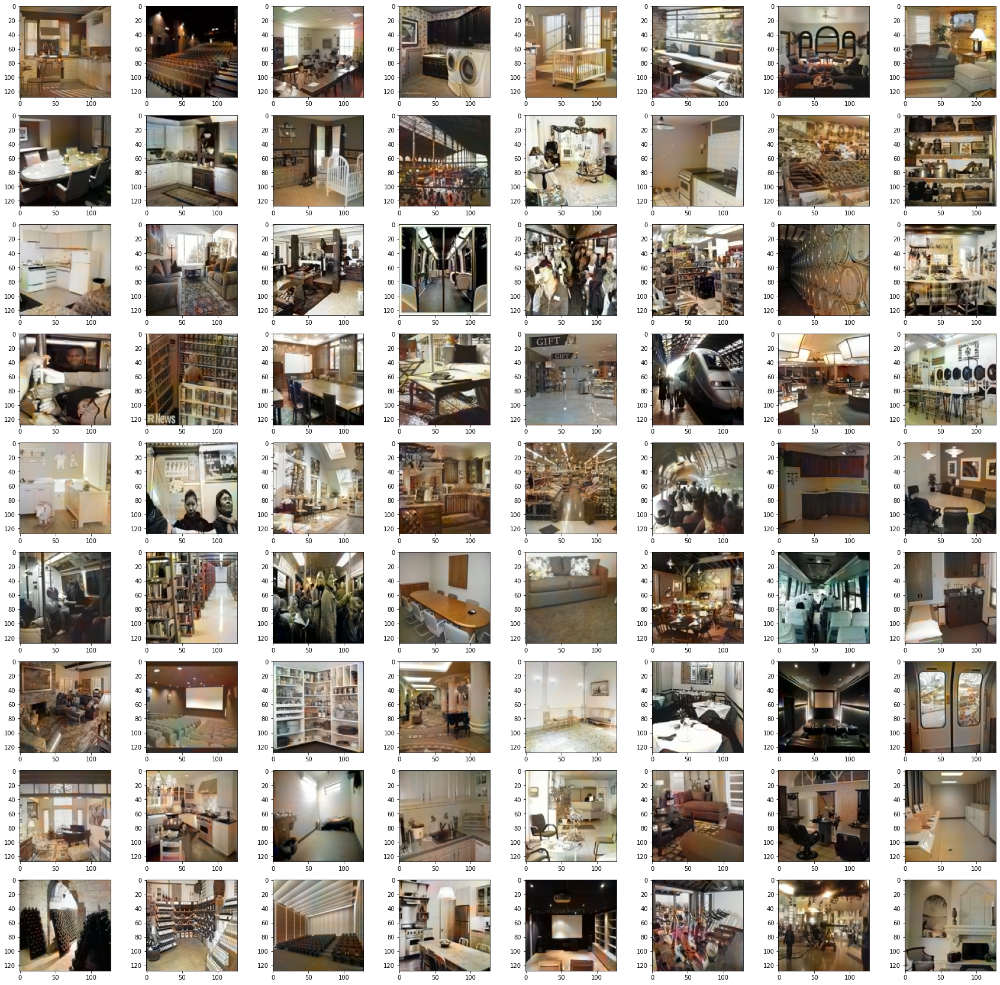

In [64]:
pyplot.figure(figsize=(30, 30))
for i in range(72):
  cur = np.zeros((128, 128, 3))
  cur[:,:,0] = test_x[i][:,:,0]
  cur[:,:,1:] = output[i]
  final = lab2rgb(cur)
  pyplot.subplot(9, 8, i+1)
  pyplot.imshow(final)
pyplot.show()

In [ ]:

model.save('my_model.h5')
model = load_model('my_model.h5')

In [ ]:
checkpoint_path = "training_1/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)

# Create a callback that saves the model's weights
cp_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,
                                                 save_weights_only=True,
                                                 verbose=1)


(64, 128, 128, 1)
(64, 128, 128, 2)
Epoch 1/60
(64, 128, 128, 1)
(64, 128, 128, 2)
(64, 128, 128, 1)
(64, 128, 128, 2)
2/9 [=====>........................] - ETA: 0s - loss: 0.4530 - mean_squared_error: 0.4530 - accuracy: 0.4523 (64, 128, 128, 1)
(64, 128, 128, 2)
3/9 [=========>....................] - ETA: 4s - loss: 0.4326 - mean_squared_error: 0.4326 - accuracy: 0.4567(64, 128, 128, 1)
(64, 128, 128, 2)
4/9 [============>.................] - ETA: 4s - loss: 0.4130 - mean_squared_error: 0.4130 - accuracy: 0.4554(64, 128, 128, 1)
(64, 128, 128, 2)
5/9 [===============>..............] - ETA: 3s - loss: 0.3930 - mean_squared_error: 0.3930 - accuracy: 0.4551(64, 128, 128, 1)
(64, 128, 128, 2)
6/9 [===================>..........] - ETA: 2s - loss: 0.3737 - mean_squared_error: 0.3737 - accuracy: 0.4555(64, 128, 128, 1)
(64, 128, 128, 2)
7/9 [======================>.......] - ETA: 1s - loss: 0.3560 - mean_squared_error: 0.3560 - accuracy: 0.4548(64, 128, 128, 1)
(64, 128, 128, 2)
8/9 [=====

/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1068: UserWarning: Color data out of range: Z < 0 in 15 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))
/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1068: UserWarning: Color data out of range: Z < 0 in 6 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))
/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1068: UserWarning: Color data out of range: Z < 0 in 4 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))
/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1068: UserWarning: Color data out of range: Z < 0 in 24 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))
/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1068: UserWarning: Color data out of range: Z < 0 in 3 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))
/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1068: UserWarning: Color da

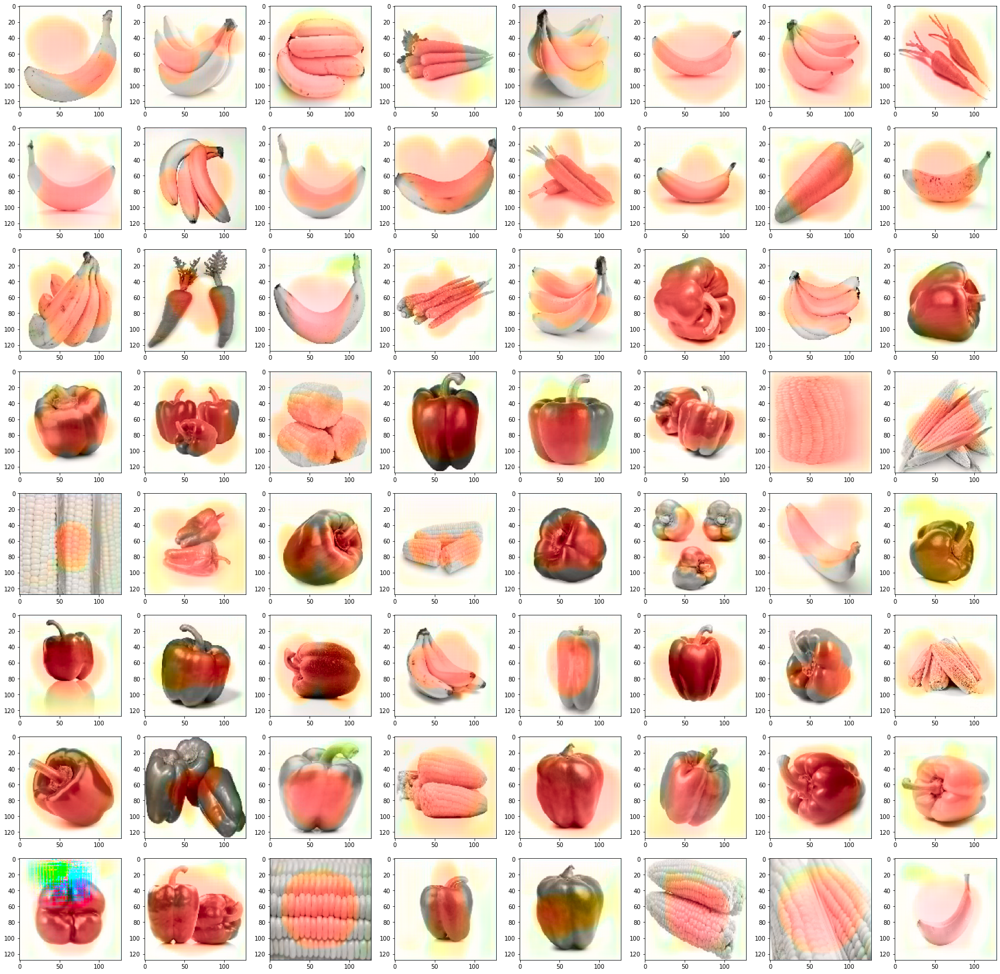

In [ ]:
epochs = 60
#model.fit(train_generator, epochs=epochs, validation_data=test_generator)
model.fit(train_generator, epochs=epochs, validation_data=test_generator, callbacks=cp_callback)

predictions = model.predict(train_generator)

model.evaluate(train_generator, batch_size=64, verbose=1)

predictions *= 128
print('Done!')
print(predictions.shape)

myit = iter(train_generator)

for i in range(len(train_generator)):
  x, y = next(myit)

print(x.shape)


pyplot.figure(figsize=(30, 30))
for i in range(64):
  cur = np.zeros((128, 128, 3))
  cur[:,:,0] = x[i][:,:,0]
  #test_generator.take()
  #x,y = test_generator.next()
  cur[:,:,1:] = predictions[i]
  final = lab2rgb(cur)
  pyplot.subplot(8, 8, i+1)
  pyplot.imshow(final)
pyplot.show()

52/52 [==============================] - 195s 4s/step - loss: 0.0149 - mean_squared_error: 0.0149 - accuracy: 0.6382


[0.014881249517202377, 0.014881249517202377, 0.6382182836532593]

In [ ]:
predictions *= 128
print('Done!')
print(predictions.shape)

Done!
(3328, 256, 256, 2)


In [ ]:
myit = iter(train_generator)

for i in range(len(train_generator)):
  x, y = next(myit)

print(x.shape)

(64, 256, 256, 1)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1068: UserWarning: Color data out of range: Z < 0 in 1 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))
/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1068: UserWarning: Color data out of range: Z < 0 in 52 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))
/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1068: UserWarning: Color data out of range: Z < 0 in 5 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))
/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1068: UserWarning: Color data out of range: Z < 0 in 2 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))
/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1068: UserWarning: Color data out of range: Z < 0 in 11 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))
/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1068: UserWarning: Color da

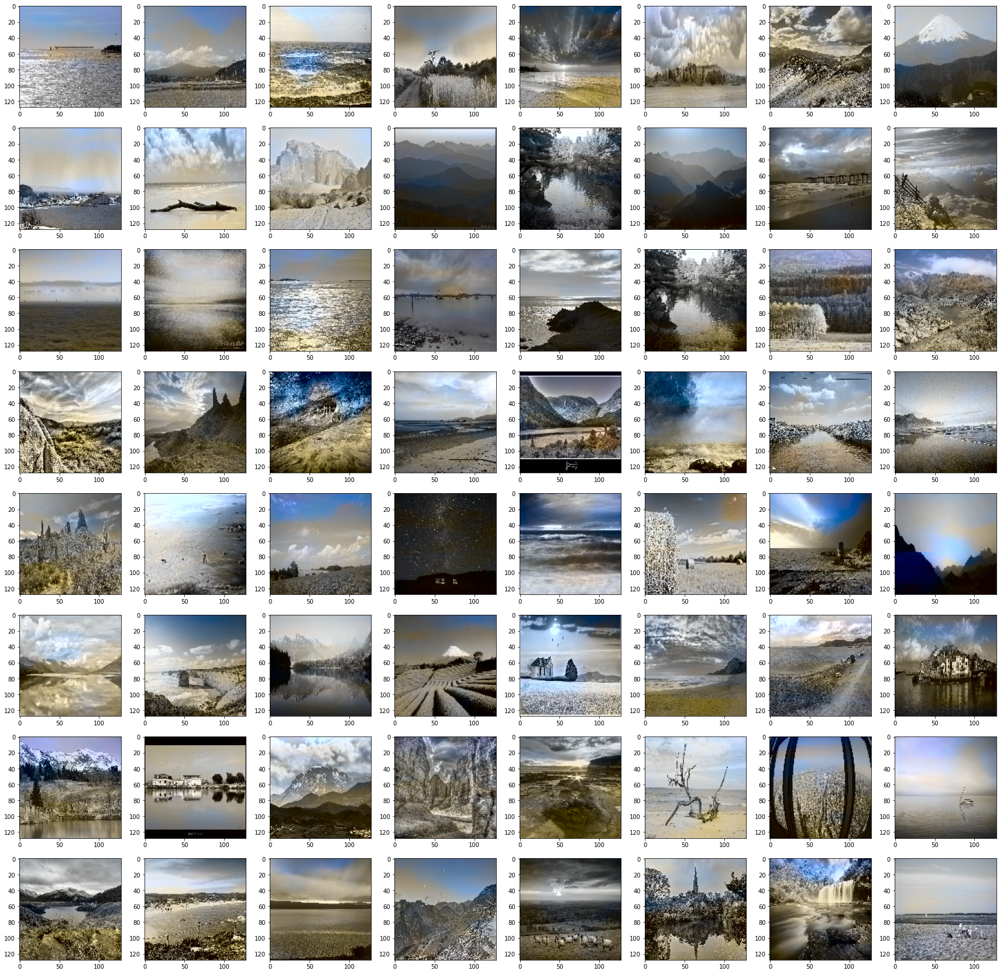

In [ ]:
pyplot.figure(figsize=(30, 30))
for i in range(64):
  cur = np.zeros((128, 128, 3))
  cur[:,:,0] = x[i][:,:,0]
  #test_generator.take()
  #x,y = test_generator.next()
  cur[:,:,1:] = predictions[i]
  final = lab2rgb(cur)
  pyplot.subplot(8, 8, i+1)
  pyplot.imshow(final)
pyplot.show()

In [ ]:
model.evaluate(X, Y, batch_size=128, verbose=1)

output = model.predict(X[:128])
output *= 128
print('Done!')
print(output.shape)

1/1 [==============================] - 23s 23s/step - loss: 0.0170 - mean_squared_error: 0.0170 - accuracy: 0.5915
Done!
(128, 256, 256, 2)


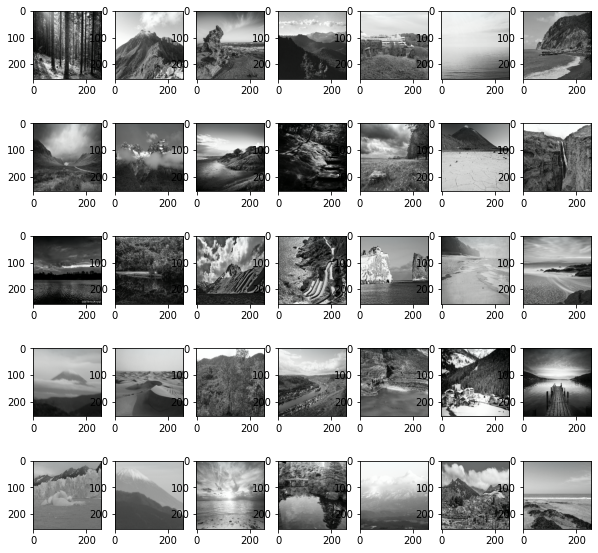

In [ ]:
pyplot.figure(figsize=(10, 10))
for i in range(35):
  cur = np.zeros((256, 256, 3))
  cur[:,:,0] = X[i][:,:,0]
  cur[:,:,1:] = output[i]
  final = lab2rgb(cur)
  pyplot.subplot(5, 7, i+1)
  pyplot.imshow(final)
pyplot.show()